#### Ref
1. https://www.tensorflow.org/tutorials/generative/pix2pix

In [1]:
import numpy as np
import random
import os
import cv2
import time
import warnings
import matplotlib.pyplot as plt
from IPython import display

In [2]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers

In [3]:
warnings.filterwarnings("ignore")
tf.__version__

'2.4.0'

---
#### Call out GPU

In [4]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the fourth GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')

        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


---
#### Parameter Settings

In [5]:
IMGWD = 256
IMGHG = 256
CHANNEL = 3
LAMBDA = 100

BUFFER_SIZE = 60000
BATCH_SIZE = 1
EPOCHS = 500
LEARNING_RATE = 2e-04

IMG_DIR = 'datasets/maps/'
MAIN_DIR = 'result/Pix2Pix_Maps/'
CHKPOINT_DIR = 'checkpoints/Pix2Pix_Maps/'

for _dir in [CHKPOINT_DIR]:
    if not os.path.isdir(_dir):
        os.makedirs(_dir)
    
CHKPOINT_PREFIX = os.path.join(CHKPOINT_DIR, "ckpt")

---
#### Preprocessing Functions

In [6]:
def load(image_file, folder='train'):
    image = tf.io.read_file(IMG_DIR + folder + '/' + image_file)
    image = tf.image.decode_jpeg(image)
    
    wd = tf.shape(image)[1]
    wd = wd // 2
    # separate drawing and real images
    real_image = tf.cast(image[:, :wd, :], tf.float32)
    input_image = tf.cast(image[:, wd:, :], tf.float32)
    
    return input_image, real_image

In [7]:
def resize(input_image, real_image, hg, wd):
    input_image = tf.image.resize(input_image, [hg, wd], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [hg, wd], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    
    return input_image, real_image

def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMGHG, IMGWD, CHANNEL])
    
    return cropped_image[0], cropped_image[1]

def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1
    
    return input_image, real_image

In [8]:
@tf.function()
def random_jitter(input_image, real_image):
    # resizing to 286 x 286 x 3
    input_image, real_image = resize(input_image, real_image, 286, 286)
    # randomly cropping to 256 x 256 x 3
    input_image, real_image = random_crop(input_image, real_image)
    
    if tf.random.uniform(()) > 0.5:
        # random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
        
    return input_image, real_image

def random_flip(input_image, real_image):
    if tf.random.uniform(()) > 0.5:
        # random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
        
    return input_image, real_image

In [9]:
def load_image_train(image_file):
    input_image, real_image = load(image_file, folder='train')
    input_image, real_image = random_jitter(input_image, real_image)
    #input_image, real_image = random_flip(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)
    input_image, real_image = resize(input_image, real_image, IMGHG, IMGWD)
    
    return input_image, real_image

def load_image_test(image_file):
    input_image, real_image = load(image_file, folder='val')
    input_image, real_image = resize(input_image, real_image, IMGHG, IMGWD)
    input_image, real_image = normalize(input_image, real_image)
    
    return input_image, real_image

##### Show one of the drawing image and its corresponding real image

got 1096 training files.
got 1098 testing files.


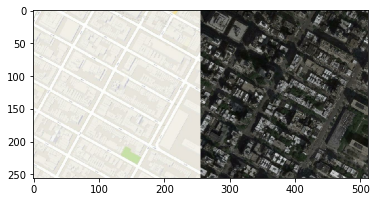

In [10]:
train_files = os.listdir(IMG_DIR + 'train')
print('got {} training files.'.format(len(train_files)))

test_files = os.listdir(IMG_DIR + 'val')
print('got {} testing files.'.format(len(test_files)))

demoIdx = random.randint(0, len(train_files))
input_img, real_img = load(train_files[demoIdx], folder='train')
input_img, real_img = resize(input_img, real_img, IMGHG, IMGWD)
image_stack = np.hstack((input_img.numpy().astype(np.uint8), real_img.numpy().astype(np.uint8)))
plt.imshow(image_stack)
plt.show()

---
#### Load Datasets

In [11]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_files)
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [12]:
test_dataset = tf.data.Dataset.from_tensor_slices(test_files)
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

---
#### Build Model
##### 1. The Generator
(Copied from tf offical pix2pix tutorial)
* 1.1. Architecture: Modified U-Net
* 1.2. Each block in the encoder: Conv --> BatchNormalization --> Leaky ReLU
* 1.3. Each block in the decoder: Transposed Conv --> BatchNormalization --> Dropout(the first 3 blocks) --> ReLU
* 1.4. There are skip connections between the encoder and decoder

In [13]:
class down_sample():
    def __init__(self, filters, size, apply_batchnorm=True):
        self.filters = filters
        self.size = size
        self.apply_batchnorm = apply_batchnorm
        self.initializer = tf.random_normal_initializer(0., 0.02)
        
    def __call__(self, inputs):
        x = layers.Conv2D(self.filters, self.size, strides=2, padding='same',
                          kernel_initializer=self.initializer, use_bias=False)(inputs)
        
        if self.apply_batchnorm == True:
            x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        
        return x

In [14]:
class up_sample():
    def __init__(self, filters, size, apply_dropout=False):
        self.filters = filters
        self.size = size
        self.apply_dropout = apply_dropout
        self.initializer = tf.random_normal_initializer(0., 0.02)
        
    def __call__(self, inputs):
        x = layers.Conv2DTranspose(self.filters, self.size, strides=2, padding='same',
                                   kernel_initializer=self.initializer, use_bias=False)(inputs)
        x = layers.BatchNormalization()(x)
        
        if self.apply_dropout == True:
            x = layers.Dropout(0.5)(x)
        x = layers.ReLU()(x)
        
        return x

In [15]:
def generator_model():
    inputs = keras.Input(shape=(IMGHG, IMGWD, CHANNEL))
    initializer = tf.random_normal_initializer(0., 0.02)
    
    down_stack = [
        down_sample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        down_sample(128, 4),                       # (bs, 64, 64, 128)
        down_sample(256, 4),                       # (bs, 32, 32, 256)
        down_sample(512, 4),                       # (bs, 16, 16, 512)
        down_sample(512, 4),                       # (bs, 8, 8, 512)
        down_sample(512, 4),                       # (bs, 4, 4, 512)
        down_sample(512, 4),                       # (bs, 2, 2, 512)
        down_sample(512, 4)                        # (bs, 1, 1, 512)
    ]
    
    up_stack = [
        up_sample(512, 4, apply_dropout=True),     # (bs, 2, 2, 1024)
        up_sample(512, 4, apply_dropout=True),     # (bs, 4, 4, 1024)
        up_sample(512, 4, apply_dropout=True),     # (bs, 8, 8, 1024)
        up_sample(512, 4),                         # (bs, 16, 16, 1024)
        up_sample(256, 4),                         # (bs, 32, 32, 512)
        up_sample(128, 4),                         # (bs, 64, 64, 256)
        up_sample(64, 4)                           # (bs, 128, 128, 128)
    ]
    
    skips = []
    x = inputs
    # Downsampling through the model
    for ds in down_stack:
        x = ds(x)
        skips.append(x)
        
    skips = reversed(skips[:-1])
    
    # Upsampling and establishing the skip connections
    for us, skip in zip(up_stack, skips):
        x = us(x)
        x = tf.keras.layers.Concatenate()([x, skip])
        
    outputs = layers.Conv2DTranspose(CHANNEL, 4, strides=2, padding='same',
                                     kernel_initializer=initializer, activation='tanh')(x) #(bs, 256, 256, 3)
    model = keras.Model(inputs=inputs, outputs=outputs, name='Generator')
    
    return model

##### 2. The Discriminator
(Copied from tf offical pix2pix tutorial)
* 2.1. The Discriminator is a PatchGAN
* 2.2. Each block in the discriminator: Conv --> BatchNormalization --> Leaky ReLU
* 2.3. Shape of output: (bs, 30, 30, 1)
* 2.4. Each 30x30 patch of the output classifies a 70x70 portion of the input image
* 2.5. Discriminator receives 2 inputs:
   * 2.5.1. Input image and the target image (real)
   * 2.5.2. Input image and the generated image (fake)
   * 2.5.3. those two inputs are concatenated together

In [16]:
def discriminator_model():
    initializer = tf.random_normal_initializer(0., 0.02)
    inputs = keras.Input(shape=(IMGWD, IMGHG, CHANNEL), name='input_image')
    target = keras.Input(shape=(IMGWD, IMGHG, CHANNEL), name='target_image')
    
    x = layers.concatenate([inputs, target]) # (bs, 256, 256, channels*2)
    x = down_sample(64, 4, False)(x)         # (bs, 128, 128, 64)
    x = down_sample(128, 4)(x)               # (bs, 64, 64, 128)
    x = down_sample(256, 4)(x)               # (bs, 32, 32, 256)
    
    x = layers.ZeroPadding2D()(x)            # (bs, 34, 34, 256)
    x = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(x) # (bs, 31, 31, 512)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    
    x = layers.ZeroPadding2D()(x)            # (bs, 33, 33, 512)
    outputs = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(x) # (bs, 30, 30, 1)
    model = keras.Model(inputs=[inputs, target], outputs=outputs, name='Discriminator')
    
    return model

##### 3. Define optimizers and losses
(Copied from tf 2 pix2pix tutorial)
* Generator Loss
  * It is a sigmoid cross entropy loss of the **generated images** and an **array of ones**
  * The paper (link: https://arxiv.org/abs/1611.07004) also includes L1 loss which is Mean Absolute Error between generated image and the target image
  * This allows the generated image to become structurally similar to the target image
  * total generator loss = GAN loss + LAMBDA * L1 loss, where LAMBDA = 100 decided by the paper.
  
* Discriminator Loss
  * The discriminator loss function takes 2 inputs: real images and generated images
  * real loss is a sigmoid cross entropy loss of the **real images** and an **array of ones**
  * the total loss is the sum of the real loss and the generated loss
 
<table>
    <tr>
        <td style='text-align:center; width: 48%; font-size: 22px;'>
            generator loss
            <img src='img/gen_loss.png'>
        </td>
        <td style='text-align:center; width: 48%; font-size: 22px;'>
            discriminator loss
            <img src='img/disc_loss.png'>
        </td>
    </tr>
</table>

In [17]:
gen_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=0.5)
disc_optimizer = tf.keras.optimizers.Adam(LEARNING_RATE, beta_1=0.5)

cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(disc_output, gen_output, target):
    GAN_loss = cross_entropy(tf.ones_like(disc_output), disc_output)
    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    
    gen_loss = GAN_loss + LAMBDA * l1_loss
    return gen_loss, GAN_loss, l1_loss

def discriminator_loss(disc_real_output, disc_gen_output):
    real_loss = cross_entropy(tf.ones_like(disc_real_output), disc_real_output)
    gen_loss = cross_entropy(tf.zeros_like(disc_gen_output), disc_gen_output)
    
    return real_loss + gen_loss

##### 4. Make Checkpoints

In [18]:
generator = generator_model()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


In [19]:
discriminator = discriminator_model()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

('Failed to import pydot. You must `pip install pydot` and install graphviz (https://graphviz.gitlab.io/download/), ', 'for `pydotprint` to work.')


In [20]:
checkpoint = tf.train.Checkpoint(generator_optimizer=gen_optimizer,
                                 discriminator_optimizer=disc_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

---
##### Visualization function

In [21]:
def generate_images(model, inputs, target):
    predicts = model(inputs, training=False)
    plt.figure(figsize=(15,15))
    
    displays = [inputs[0], target[0], predicts[0]]
    titles = ['Input Image', 'Ground Truth', 'Predicted Image']
    
    print('One of the results: ')
    for i in range(len(displays)):
        plt.subplot(1, 3, i+1)
        plt.title(titles[i])
        plt.imshow(((displays[i] + 1) * 127.5).numpy().astype(np.uint8))
        plt.axis('off')
    plt.show()

---
#### Training Function

In [22]:
@tf.function
def train_step(input_img, target_img, epoch):
    with tf.GradientTape()as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_img, training=True)
        
        disc_real_output = discriminator([input_img, target_img], training=True)
        disc_generated_output = discriminator([input_img, gen_output], training=True)
        
        gen_loss, GAN_loss, l1_loss = generator_loss(disc_generated_output, gen_output, target_img)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
        
    gen_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

In [23]:
def fit(train_dataset, epochs, test_dataset):
    for epoch in range(epochs):
        start = time.time()
        display.clear_output(wait=True)
        
        print('Epoch: {}'.format(epoch + 1))
        for test_input, test_target in test_dataset.take(1):
            generate_images(generator, test_input, test_target)
            
        for idx, (input_img, target_img) in train_dataset.enumerate():
            train_step(input_img, target_img, epoch)
        
        # saving (checkpoint) the model every 15 epochs
        if (epoch + 1) % 15 == 0 or epoch == epochs - 1:
            checkpoint.save(file_prefix=CHKPOINT_PREFIX)
        
        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time() - start))

---
#### Training Process

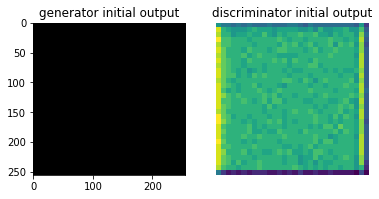

In [24]:
plt.figure()

plt.subplot(1, 2, 1)
plt.title('generator initial output')
generated_image = generator(input_img[tf.newaxis,...], training=False)
plt.imshow(generated_image[0,...].numpy().astype(np.uint8))

plt.subplot(1, 2, 2)
plt.title('discriminator initial output')
disc_output = discriminator([input_img[tf.newaxis,...], generated_image], training=False)
plt.imshow(disc_output[0,...,-1].numpy().astype(np.uint8))

plt.axis('off')
plt.show()

Epoch: 500
One of the results: 


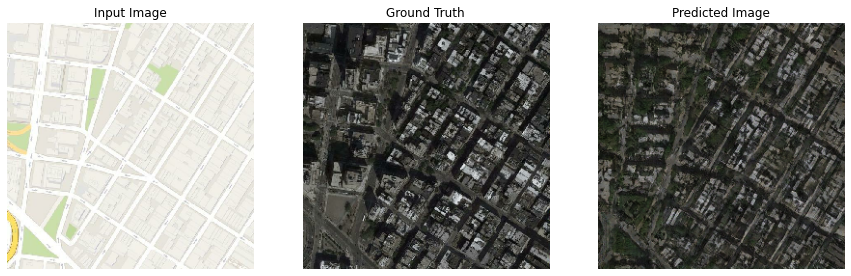

Time taken for epoch 500 is 34.4525842666626 sec



In [25]:
fit(train_dataset, EPOCHS, test_dataset)

---
#### Testing Process

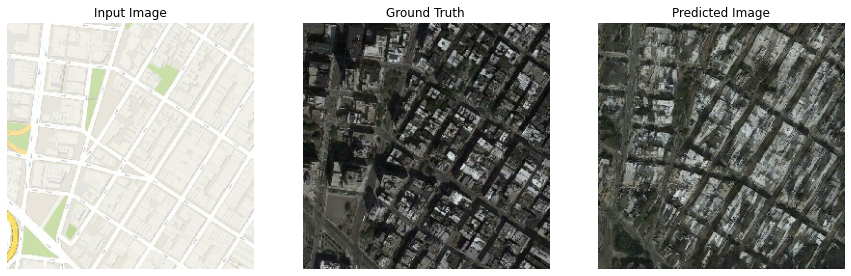

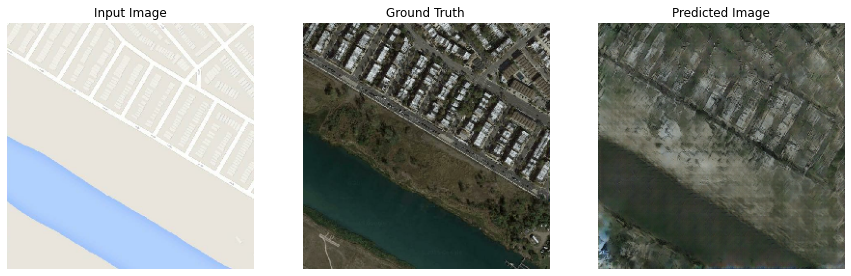

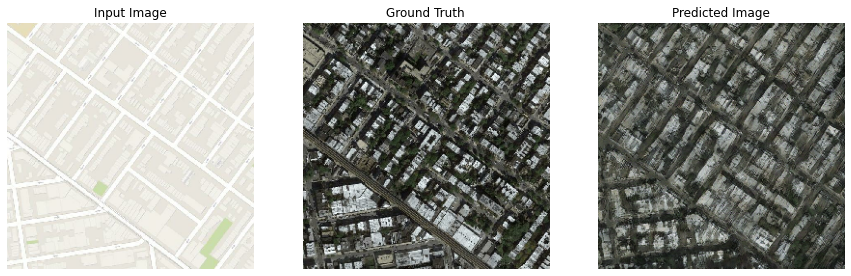

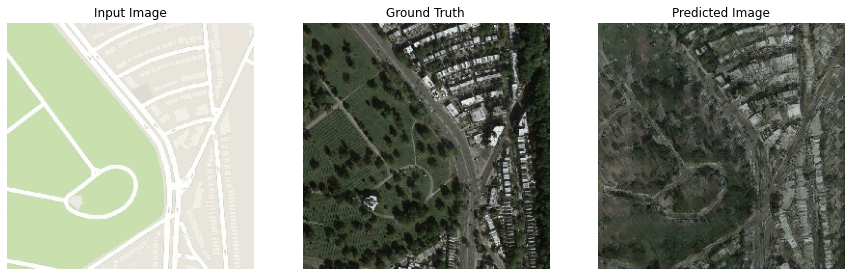

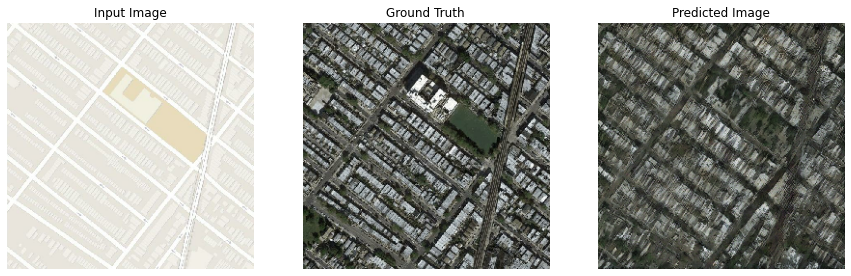

...

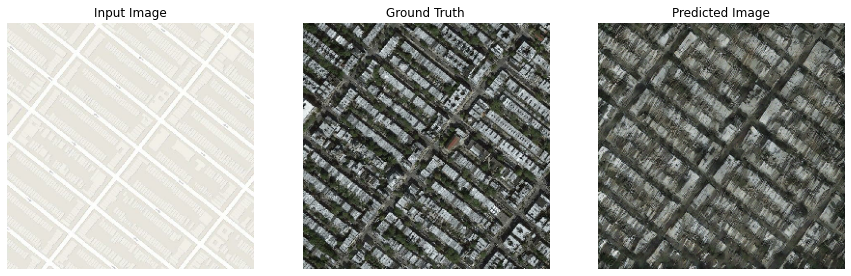

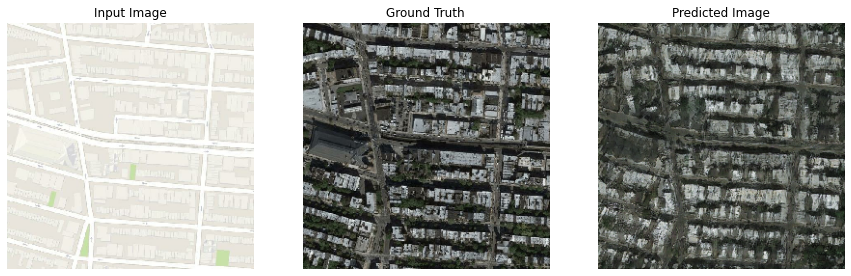

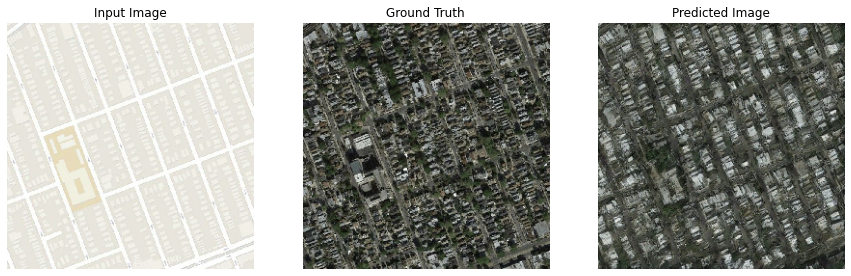

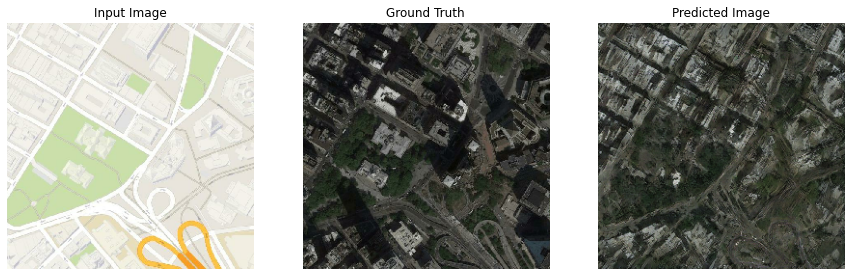

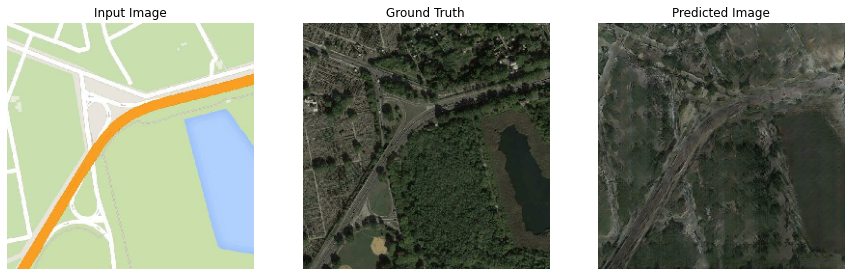

In [26]:
# restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(CHKPOINT_DIR))

# Run the trained model on a few examples from the test dataset
for inputs, target in test_dataset.take(20):
    predicts = generator(inputs, training=False)
    titles = ['Input Image', 'Ground Truth', 'Predicted Image']
    
    for inp, tar, pre in zip(inputs, target, predicts):
        plt.figure(figsize=(15,15))
        displays = [inp, tar, pre]
        for i in range(len(titles)):
            plt.subplot(1, 3, i+1)
            plt.title(titles[i])
            plt.imshow(((displays[i] + 1) * 127.5).numpy().astype(np.uint8))
            plt.axis('off')
        plt.show()